### preparing 
- inmport the modules and the
- estabish the settings and prefrences
- add the api used in this project
- prepare the .env file  

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px 
from fredapi import Fred # this is the web in which we will get our echononmic data
import os
from dotenv import load_dotenv,dotenv_values
# loading the .env file
load_dotenv('sec.env')
# getting my fred api key
fred_key = os.getenv('MY_API')
# this is just a unified style for all plots
plt.style.use('fivethirtyeight') 

# this will increase the number of the columns that can be show in the table
pd.set_option('display.max_columns',500) 

# this a list of color that we can use to change colors of the plots 
color_pal = plt.rcParams["axes.prop_cycle"].by_key()['color']


### searching the data:


- creating the object : so we can pull,search all the data from fred website.

In [2]:
fred = Fred(api_key=fred_key)   

- search for data on fred this will return a pandas dataframe which will save us the time of :
    1. looking on the web.
    2. getting a csv for any dataset.
    3. loading the csv via pandas .

In [3]:
# this will return a table/dataframe for the datasets inside fred.com that is about statistics and probablity
fred_search_df = fred.search('S&P') # the order_by is for sorting it
fred_search_df.head()


,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CSUSHPINSA,CSUSHPINSA,2025-05-20,2025-05-20,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2025-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2025-04-29 08:11:17-05:00,88,"For more information regarding the index, plea..."
CSUSHPISA,CSUSHPISA,2025-05-20,2025-05-20,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2025-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Seasonally Adjusted,SA,2025-04-29 08:11:19-05:00,78,"For more information regarding the index, plea..."
SP500,SP500,2025-05-20,2025-05-20,S&P 500,2015-04-30,2025-05-19,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2025-05-19 19:02:00-05:00,83,The observations for the S&P 500 represent the...
SPCS20RSA,SPCS20RSA,2025-05-20,2025-05-20,S&P CoreLogic Case-Shiller 20-City Composite H...,2000-01-01,2025-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Seasonally Adjusted,SA,2025-04-29 08:12:19-05:00,67,"For more information regarding the index, plea..."
SPCS20RNSA,SPCS20RNSA,2025-05-20,2025-05-20,S&P CoreLogic Case-Shiller 20-City Composite H...,2000-01-01,2025-02-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2025-04-29 08:12:18-05:00,33,"For more information regarding the index, plea..."


### pulling the raw data and plot it
---
  so what are we about to do is getting the **S&P500 _shorts for standard and poors_** from the web and plot it
> the S&P500 is a stock indicator which measures the performance of the grand 500 U.S companies in it.
  It's often considered as a metric for measuring the overall performance of the american(U.S) econonmy

<Axes: title={'center': 'S&P500'}>

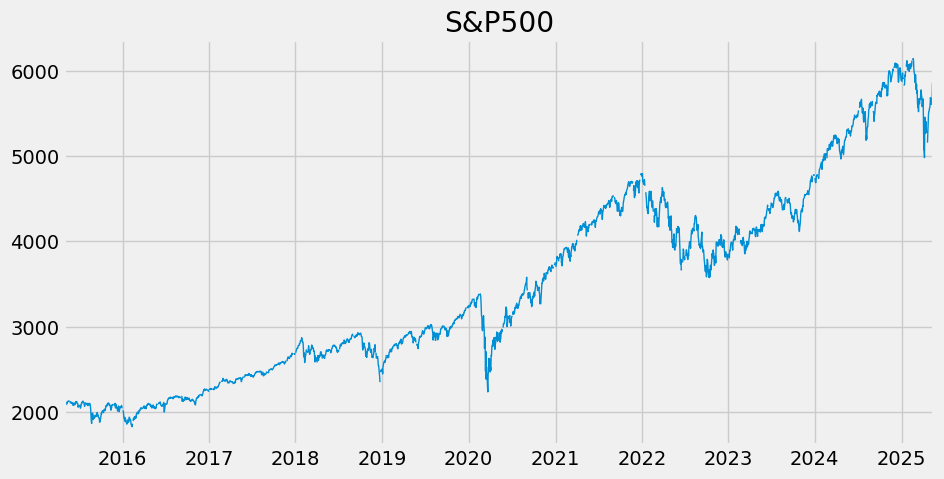

In [4]:
SP500 = fred.get_series(series_id='SP500') # you can also specify the interval of the data using observation


#this id the differance between the lowest and the highest stock price over the time(from the last 10Y to now)
SP500.plot(figsize=(10,5),title='S&P500',lw =1)
#lw for changing the plot's width

## pull and merge(JOIN) multiple Data  Series

### 1. fetching the  ***unemployment metadata set*** 



1. pulling the the following datasets from fred

In [19]:
# filter is used to get the monthly updated datasets
unemp_df =fred.search('unemployment rate in state', filter=('frequency','Monthly')) 
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent" ') #more filtering
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate in ')]




2. looping through the metadata
- we will loop through a the data series id
- fetch all the data using data series 
- store the data in a list called **list_of_unemp_rate** 
> the list represents the unemployment rate for each state 

In [6]:
list_of_unemp_rate = []
for i in unemp_df.index:
    temp_data = fred.get_series(series_id=i)
    temp_data = temp_data.to_frame(name=i)
    list_of_unemp_rate.append(temp_data)


3. concate(turn) our list into 1 data frame

In [7]:
unemp_results=pd.concat(list_of_unemp_rate,axis=1)
unemp_state = unemp_results

- since reading data is insane we can change each id to a state

In [8]:
id_labels=unemp_df['title'].str.replace('Unemployment Rate in ','').to_dict()
unemp_state.columns = [id_labels[c] for c in unemp_state.columns]
unemp_state

,California,Texas,New York,Florida,Pennsylvania,Ohio,Michigan,Alabama,Massachusetts,North Carolina,Illinois,New Jersey,Georgia,Colorado,Arizona,Wisconsin,Virginia,Kentucky,South Carolina,New Mexico,Minnesota,Tennessee,Washington,Maryland,Oregon,West Virginia,Nevada,Arkansas
1976-01-01,9.2,5.8,10.3,9.6,8.1,8.1,9.9,6.7,10.6,6.5,6.6,10.2,8.4,5.8,10.2,5.8,6.0,5.6,7.3,8.6,5.9,6.0,8.5,6.5,9.5,7.4,9.2,7.3
1976-02-01,9.2,5.8,10.3,9.7,8.1,8.1,9.9,6.6,10.6,6.5,6.6,10.2,8.4,5.8,10.2,5.8,6.0,5.6,7.3,8.6,5.9,6.0,8.5,6.5,9.5,7.4,9.2,7.3
1976-03-01,9.1,5.9,10.2,9.6,8.1,8.1,9.9,6.6,10.6,6.5,6.6,10.2,8.3,5.7,10.2,5.8,6.0,5.6,7.3,8.6,5.8,6.0,8.5,6.5,9.4,7.4,9.2,7.3
1976-04-01,9.0,5.9,10.2,9.5,8.1,7.9,9.8,6.5,10.4,6.3,6.6,10.3,8.2,5.6,10.0,5.7,5.9,5.6,7.1,8.6,5.7,6.0,8.5,6.5,9.3,7.4,9.0,7.2
1976-05-01,8.9,6.0,10.2,9.3,8.1,7.8,9.6,6.4,10.1,6.1,6.6,10.3,8.1,5.6,9.8,5.6,5.8,5.5,7.0,8.6,5.6,5.9,8.5,6.6,9.1,7.4,8.8,7.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-01,5.5,4.2,4.4,3.5,3.7,4.5,5.2,3.3,4.1,3.7,4.9,4.6,3.6,4.6,3.9,3.1,2.9,5.4,4.4,4.4,3.0,3.7,4.4,3.1,4.3,4.1,5.8,3.6
2024-12-01,5.5,4.2,4.4,3.4,3.7,4.5,5.2,3.3,4.1,3.7,4.9,4.6,3.6,4.6,3.8,3.1,2.9,5.3,4.4,4.3,3.0,3.7,4.4,3.1,4.3,4.1,5.8,3.6
2025-01-01,5.4,4.1,4.4,3.5,3.8,4.6,5.3,3.3,4.2,3.7,4.9,4.6,3.6,4.7,3.9,3.2,3.0,5.3,4.3,4.4,3.0,3.7,4.3,3.0,4.4,4.0,5.8,3.6
2025-02-01,5.4,4.1,4.3,3.6,3.8,4.7,5.4,3.3,4.3,3.7,4.8,4.6,3.6,4.7,3.9,3.2,3.1,5.3,4.2,4.4,3.0,3.7,4.4,3.0,4.5,3.9,5.8,3.6


4. handling Null values
- getting and plotting total NAs

<Axes: >

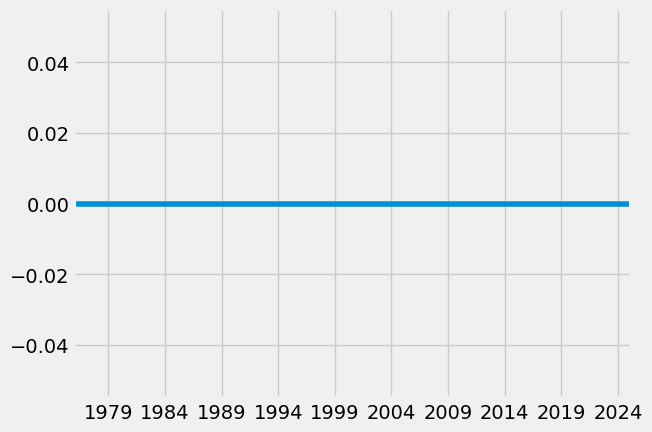

In [9]:
unemp_state.isna().sum(axis=1).plot()

- no need for filling the NAs with the mean

5. ploting the dataset
for this one we will use plotly

In [10]:
# plot the unemplyment rate
px.line(unemp_state)

6. investigations

this plot chart indicates that there is ***huge*** rate of unemployment in the covide-19 pandimic.

so we will pull the data from the time of april 2020 from each state for further investigation


(591, 28)


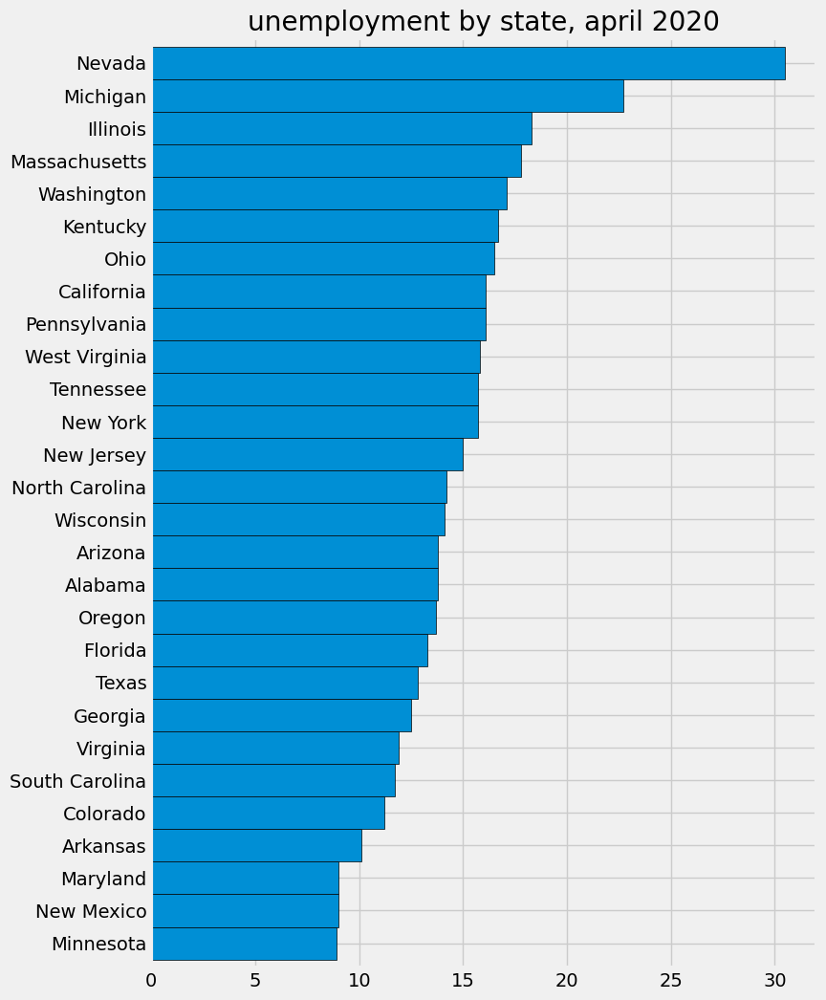

In [11]:
ax_unemp = unemp_state.loc[unemp_state.index == '2020-04-01'].T\
    .sort_values('2020-04-01')\
    .plot(kind='barh',figsize=(8,12),title='unemployment by state, april 2020',width=1,edgecolor = 'black') 
     # the (.T) is for turning/transforming
print(unemp_state.shape)
ax_unemp.legend().remove()
plt.show()

### 2. fetching the  ***participation metadata set*** 


1. pulling the the following datasets from fred

In [12]:
# filter is used to get the monthly updated datasets
part_df =fred.search('participation rate in state', filter=('frequency','Monthly')) 
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent" ') #more filtering
part_df = part_df.loc[part_df['title'].str.contains('Labor Force Participation Rate for')]



In [13]:
list_of_part_rate = []
for i in part_df.index:
    temp_data = fred.get_series(series_id=i)
    temp_data = temp_data.to_frame(name=i)
    list_of_part_rate.append(temp_data)

In [14]:
part_results=pd.concat(list_of_part_rate,axis=1)
part_state = part_results

In [15]:
part_id_labels=part_df['title'].str.replace('Labor Force Participation Rate for ','').to_dict()
part_state.columns = [part_id_labels[c] for c in part_state.columns]

4. handling Null values
- getting and plotting total NAs

<Axes: >

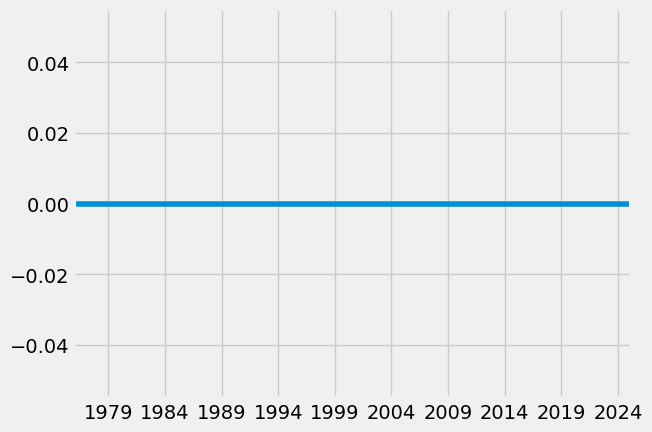

In [16]:
part_state.isna().sum(axis=1).plot()

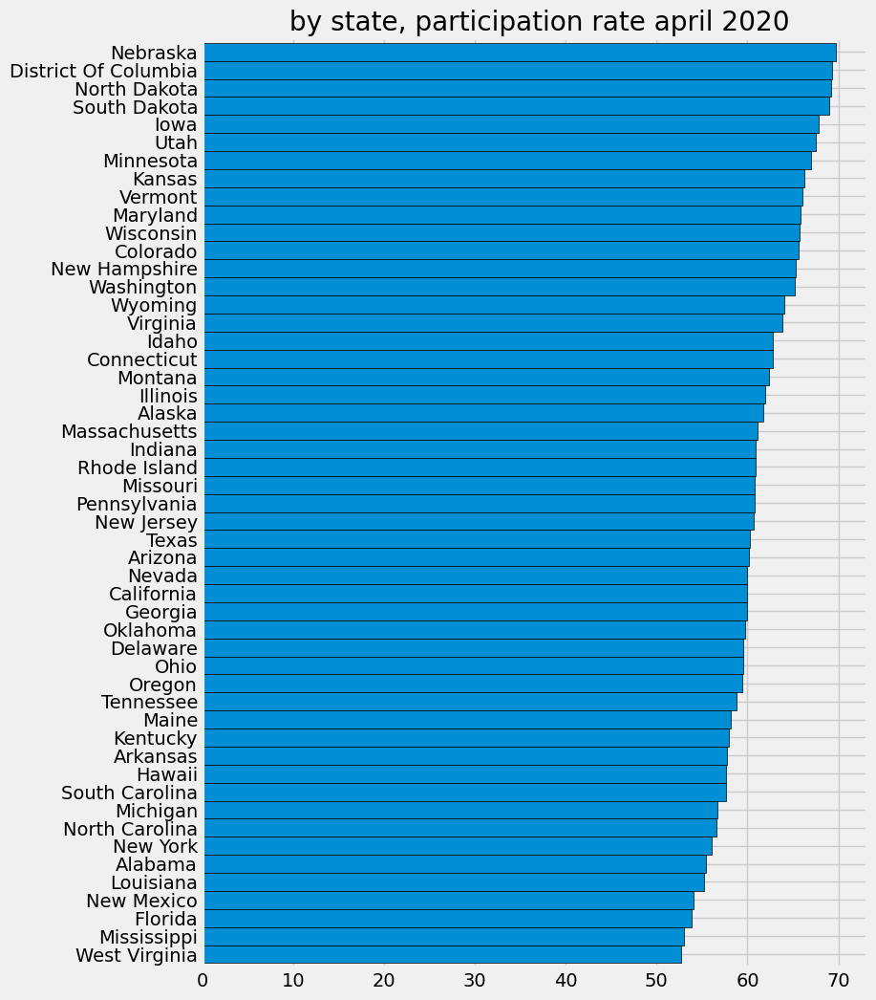

In [17]:
ax_part = part_state.loc[part_state.index == '2020-04-01'].T\
    .sort_values('2020-04-01')\
    .plot(kind='barh',figsize=(8,12),title=' by state, participation rate april 2020',width=1,edgecolor = 'black') 
     # the (.T) is for turning/transforming
     
ax_part.legend().remove()
plt.show()

# participation vs. unemployment plot

now we want to get the participation versus uneployment rate per state

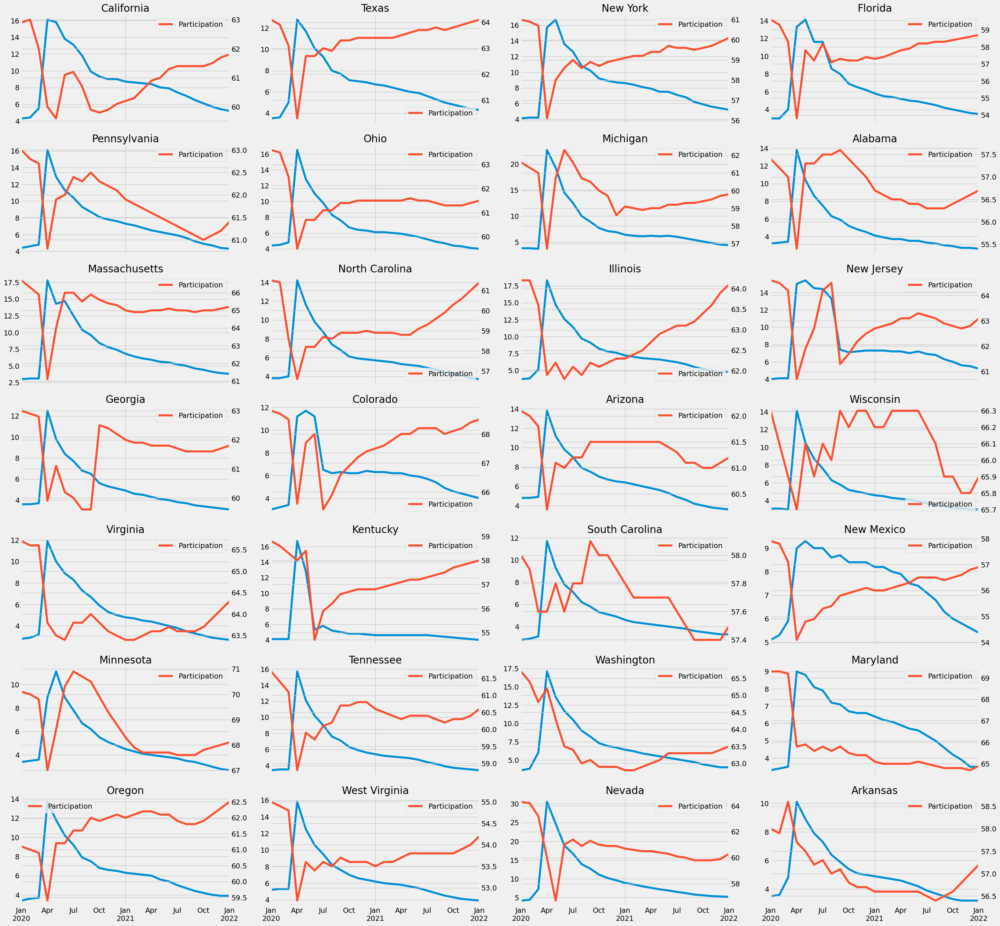

In [18]:
fig,axs = plt.subplots(7,4,figsize = (30,30),sharex=True)
axs = axs.flatten()
i =0
for state in unemp_state.columns:        
    ax2 = axs[i].twinx()
    unemp_state.query('index >= 2020 and index <= 2022')[state]\
        .plot(ax = axs[i],label = 'Unemployment')
    part_state.query('index >= 2020 and index <= 2022')[state]\
        .plot(ax = ax2,label = 'Participation', color=color_pal[1])
    axs[i].set_title(state)
    plt.legend()
    i += 1


plt.show()

# the end of the eplotary data analysis